## Financial Quantitative Analysis using Python 

### - Exploratory and statistical data analysis 
### - Interactive Data visualization
### - Asset Allocation 
### - Capital Asset Pricing Model

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
import plotly.express as px
import plotly.figure_factory as ff

In [2]:

path = "https://raw.githubusercontent.com/piyushbiraje/Financial-data-analysis-pb/main/stock.csv"

stocks_df = pd.read_csv(path)

# Sort the stock data by date
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


### EXPLORATORY DATA ANALYSIS AND INITIAL VISUALIZATION

In [3]:
# Check if data contains any null values
stocks_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [4]:
# Getting dataframe info
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [5]:
# Function to plot the entire dataframe
# input = dataframe df, title of the figure

def show_plot(df, fig_title):
    df.plot(x = 'Date', figsize = (15,7), linewidth = 3, title = fig_title)
    plt.grid()
    plt.show()

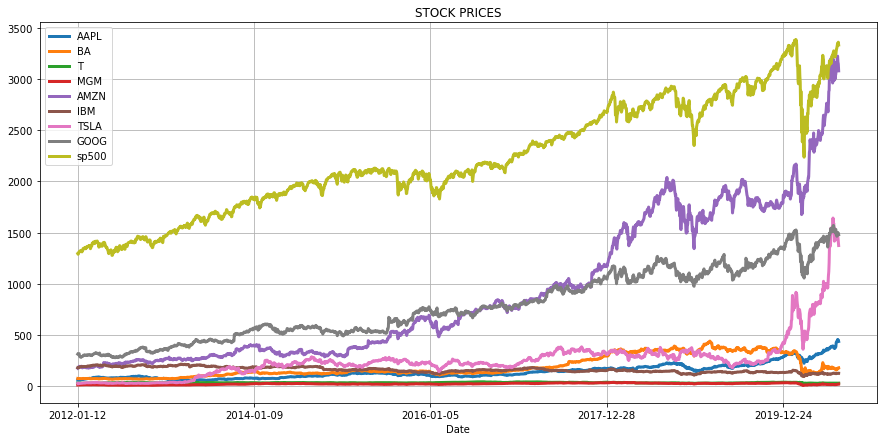

In [6]:
# Plot the data
show_plot(stocks_df, 'STOCK PRICES')

The difference between prices of these stocks is very high. Hence, we normalize the data and plot again to see the relative gains in stock prices.

In [7]:
# define normalize function as this will be used repeatedly 

def normalize(df):
    x = df.copy()
    # Loop through each stock (while ignoring time columns with index 0)
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x

normalize(stocks_df)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


Plotting normalized data:

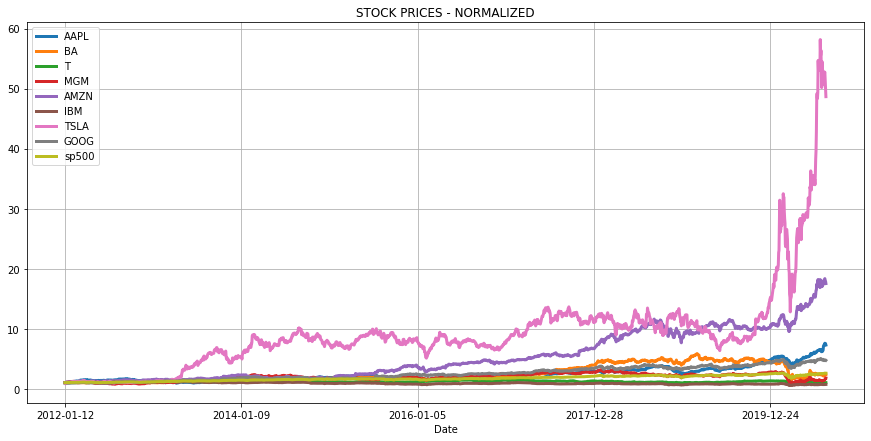

In [8]:
show_plot(normalize(stocks_df), 'STOCK PRICES - NORMALIZED')

### INTERACTIVE DATA VISUALIZATION

In [9]:
# Function to perform an interactive data plotting using plotly express

def interactive_plot(df, title):
    fig = px.line(title = title)

    # Loop through each stock (ignore time column - index 0)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

    fig.show()

#### In the following chart, move your mouse pointer on the graph to see the date and stock price at that point

In [10]:
# Plot interactive chart
interactive_plot(stocks_df, 'Stock Prices')

### CALCULATE DAILY RETURNS OF STOCKS 

In [11]:
# define a function to calculate stocks daily returns 
def daily_return(df):
    df_daily_return = df.copy()

    # Loop through each stock (ignore time column - index 0)
    for i in df.columns[1:]:

        # Loop through each row belonging to the stock
        for j in range(1, len(df)):

            # % change from the previous day
            df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
        # set the value of first row to zero since the previous value is not available
        df_daily_return[i][0] = 0
  
    return df_daily_return

In [12]:
# Get the daily returns 
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


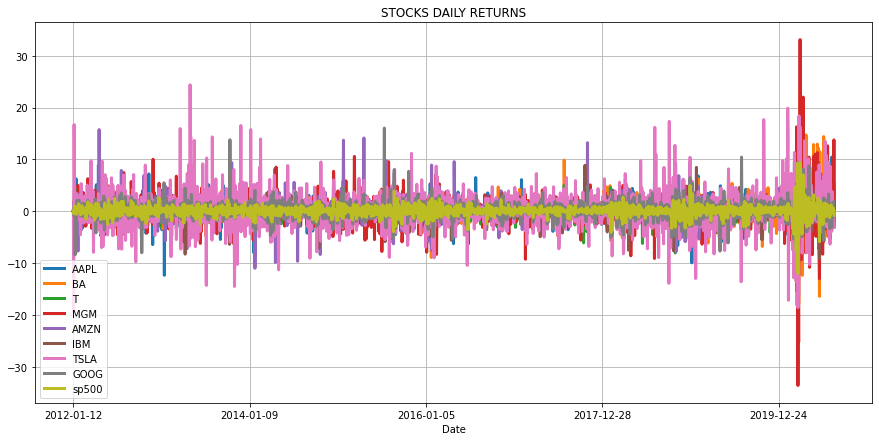

In [13]:
# Plot the daily returns
# Notice huge drops in MGM around March 2020 (Pandemic effect)
show_plot(stocks_daily_return, 'STOCKS DAILY RETURNS')

### CORRELATION BETWEEN DAILY RETURNS 

In [14]:
# Daily Return Correlation
cm = stocks_daily_return.drop(columns = ['Date']).corr()

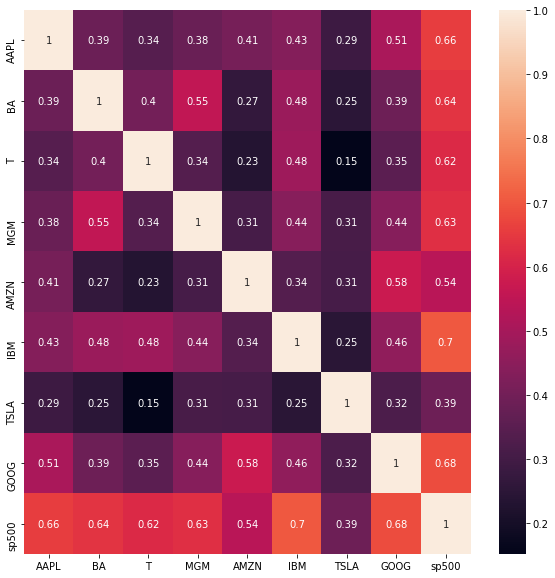

In [15]:
plt.figure(figsize=(10, 10))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax);

#### HISTOGRAM OF DAILY RETURNS:

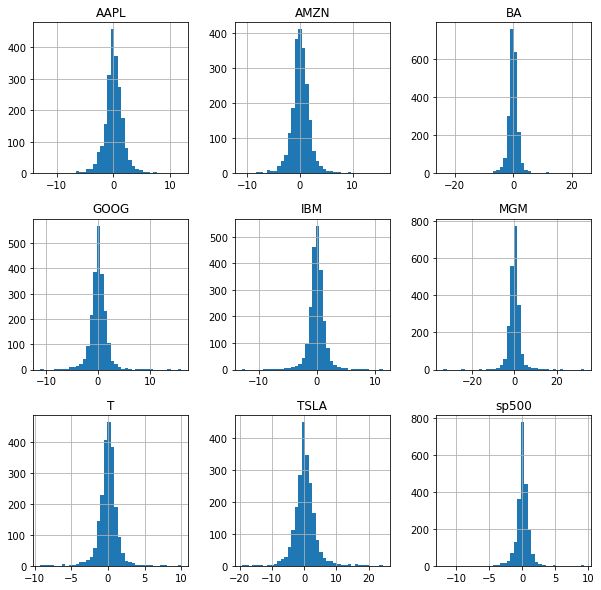

In [16]:
# Stock returns are normally distributed with zero mean 
# Higher Standard deviation indicates a more volatile stock e.g. Tesla
stocks_daily_return.hist(figsize=(10, 10), bins = 40);

In [17]:
# Group all data returns together in a list
# Make a copy of the daily returns dataframe
df_hist = stocks_daily_return.copy()

# Drop the date
df_hist = df_hist.drop(columns = ['Date'])

data = []

# Loop through every column
for i in df_hist.columns:
    data.append(stocks_daily_return[i].values)
data

[array([ 0.        , -0.37494578,  1.16481192, ..., -2.44945751,
         1.45347999, -2.9739868 ]),
 array([ 0.        , -1.20514366,  0.85790887, ..., -1.26596576,
         5.52287953,  0.40131597]),
 array([ 0.        , -0.16600597,  0.59860326, ...,  0.60321716,
         0.5996036 ,  0.        ]),
 array([ 0.        ,  1.81368508, -0.8097166 , ...,  3.08776831,
        13.76772918, -0.69284065]),
 array([ 0.        ,  1.41533854,  1.8159433 , ..., -1.78418726,
        -0.60932259, -2.14379167]),
 array([ 0.        , -0.76986928,  0.46885241, ..., -0.91976211,
         1.72055219, -0.28322004]),
 array([  0.        , -19.32743009,  16.71785359, ...,  -2.47519409,
         -2.35009162,  -3.1143992 ]),
 array([ 0.        , -0.73851634,  0.57441015, ..., -0.37397414,
         0.10772812, -1.05474435]),
 array([ 0.        , -0.49479228,  0.35529545, ...,  0.06330295,
         0.27422185, -0.79691324])]

In [18]:
# Some stocks have extreme gains and losses (eg: Tesla, MGM, Boieng) these are more risky investments

fig = ff.create_distplot(data, df_hist.columns)
fig.show()

# Asset Allocation and Statistical Data Analysis

### RANDOM ASSET ALLOCATION AND CALCULATING PORTFOLIO DAILY RETURN


In [19]:
# create random portfolio weights, sum = 1

# Set random seed
np.random.seed()

# Create random weights for the stocks and normalize them
weights = np.array(np.random.random(9))

# Ensure that the sum of all weights are = 1
weights = weights / np.sum(weights) 
print(weights, weights.sum())



[0.1497854  0.24347992 0.09857099 0.12390427 0.00540659 0.1259008
 0.16730219 0.04526644 0.0403834 ] 1.0


In [20]:
# Normalize the stock avalues 
df_portfolio = normalize(stocks_df)
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


In [21]:
for counter, stock in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock] * weights[counter]
    df_portfolio[stock] = df_portfolio[stock] * 1000000
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.497854e+05,243479.919697,98570.991291,123904.268263,5406.587198,125900.803408,1.673022e+05,45266.440154,40383.399507
1,2012-01-13,1.492238e+05,240545.636888,98407.357560,126151.501488,5483.108710,124931.531805,1.349670e+05,44932.140095,40183.585564
2,2012-01-17,1.509620e+05,242609.299243,98996.427210,125130.031841,5582.678855,125517.276305,1.575306e+05,45190.234869,40326.356015
3,2012-01-18,1.525295e+05,242028.894206,99258.235943,130033.086150,5821.769626,126263.411662,1.587742e+05,45501.530533,40774.298315
4,2012-01-19,1.520461e+05,243641.130421,99552.770767,130748.114903,5975.734134,125879.884559,1.584781e+05,45980.335233,40975.668585
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,1.095425e+06,561961.052013,97687.383544,170789.714877,98495.282283,87478.566311,8.794588e+06,212677.422785,103733.435883
2155,2020-08-06,1.133644e+06,555254.142908,97654.657452,188563.286747,99108.988836,87945.773690,8.821593e+06,216500.566678,104400.202810
2156,2020-08-07,1.105875e+06,548224.815580,98243.727102,194385.684168,97340.698888,87136.881787,8.603241e+06,215690.910544,104466.291217
2157,2020-08-10,1.121949e+06,578502.611705,98832.800024,221148.178722,96747.580023,88636.117315,8.401057e+06,215923.270311,104752.760611


In [22]:
# create an additional column = sum of all $ values in the portfolio
df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
df_portfolio



C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $
0,2012-01-12,1.497854e+05,243479.919697,98570.991291,123904.268263,5406.587198,125900.803408,1.673022e+05,45266.440154,40383.399507,1.000000e+06
1,2012-01-13,1.492238e+05,240545.636888,98407.357560,126151.501488,5483.108710,124931.531805,1.349670e+05,44932.140095,40183.585564,9.648256e+05
2,2012-01-17,1.509620e+05,242609.299243,98996.427210,125130.031841,5582.678855,125517.276305,1.575306e+05,45190.234869,40326.356015,9.918448e+05
3,2012-01-18,1.525295e+05,242028.894206,99258.235943,130033.086150,5821.769626,126263.411662,1.587742e+05,45501.530533,40774.298315,1.000985e+06
4,2012-01-19,1.520461e+05,243641.130421,99552.770767,130748.114903,5975.734134,125879.884559,1.584781e+05,45980.335233,40975.668585,1.003278e+06
...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,1.095425e+06,561961.052013,97687.383544,170789.714877,98495.282283,87478.566311,8.794588e+06,212677.422785,103733.435883,1.122284e+07
2155,2020-08-06,1.133644e+06,555254.142908,97654.657452,188563.286747,99108.988836,87945.773690,8.821593e+06,216500.566678,104400.202810,1.130466e+07
2156,2020-08-07,1.105875e+06,548224.815580,98243.727102,194385.684168,97340.698888,87136.881787,8.603241e+06,215690.910544,104466.291217,1.105461e+07
2157,2020-08-10,1.121949e+06,578502.611705,98832.800024,221148.178722,96747.580023,88636.117315,8.401057e+06,215923.270311,104752.760611,1.092755e+07


### Portfolio daily return 

In [23]:
# Define a new column in the dataframe and set it to zeros
df_portfolio['portfolio daily % return'] = 0.0000

for i in range(1, len(stocks_df)):
    # daily % change
    df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['portfolio daily worth in $'][i] - df_portfolio['portfolio daily worth in $'][i-1]) / df_portfolio['portfolio daily worth in $'][i-1]) * 100 

df_portfolio



,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $,portfolio daily % return
0,2012-01-12,1.497854e+05,243479.919697,98570.991291,123904.268263,5406.587198,125900.803408,1.673022e+05,45266.440154,40383.399507,1.000000e+06,0.000000
1,2012-01-13,1.492238e+05,240545.636888,98407.357560,126151.501488,5483.108710,124931.531805,1.349670e+05,44932.140095,40183.585564,9.648256e+05,-3.517438
2,2012-01-17,1.509620e+05,242609.299243,98996.427210,125130.031841,5582.678855,125517.276305,1.575306e+05,45190.234869,40326.356015,9.918448e+05,2.800423
3,2012-01-18,1.525295e+05,242028.894206,99258.235943,130033.086150,5821.769626,126263.411662,1.587742e+05,45501.530533,40774.298315,1.000985e+06,0.921529
4,2012-01-19,1.520461e+05,243641.130421,99552.770767,130748.114903,5975.734134,125879.884559,1.584781e+05,45980.335233,40975.668585,1.003278e+06,0.229063
...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,1.095425e+06,561961.052013,97687.383544,170789.714877,98495.282283,87478.566311,8.794588e+06,212677.422785,103733.435883,1.122284e+07,0.223940
2155,2020-08-06,1.133644e+06,555254.142908,97654.657452,188563.286747,99108.988836,87945.773690,8.821593e+06,216500.566678,104400.202810,1.130466e+07,0.729122
2156,2020-08-07,1.105875e+06,548224.815580,98243.727102,194385.684168,97340.698888,87136.881787,8.603241e+06,215690.910544,104466.291217,1.105461e+07,-2.211992
2157,2020-08-10,1.121949e+06,578502.611705,98832.800024,221148.178722,96747.580023,88636.117315,8.401057e+06,215923.270311,104752.760611,1.092755e+07,-1.149350


### PORTFOLIO ALLOCATION - DAILY RETURN/WORTH CALCULATION (FUNCTION)


In [24]:
# Lets assume we have $1M to be invested and we will allocate this fund based on the weights of the stocks

# Create a function that takes in the stock prices along with the weights and retuns:
# 1. Daily value of each individual security in $ over the specified time period
# 2. Overall daily worth of the entire portfolio 
# 3. Daily return 

def portfolio_allocation(df, weights):

    df_portfolio = df.copy()

    # Normalize the stock avalues 
    df_portfolio = normalize(df_portfolio)

    for counter, stock in enumerate(df_portfolio.columns[1:]):
        df_portfolio[stock] = df_portfolio[stock] * weights[counter]
        df_portfolio[stock] = df_portfolio[stock] * 1000000

    df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)

    df_portfolio['portfolio daily % return'] = 0.0000

    for i in range(1, len(stocks_df)):
    
        # Calculate the percentage of change from the previous day
        df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['portfolio daily worth in $'][i] - df_portfolio['portfolio daily worth in $'][i-1]) / df_portfolio['portfolio daily worth in $'][i-1]) * 100 

    # set the value of first row to zero, as previous value is not available
    df_portfolio['portfolio daily % return'][0] = 0
    return df_portfolio


### PORTFOLIO DATA VISUALIZATION


In [25]:
# Plot the portfolio daily return
fig = px.line(x = df_portfolio.Date, y = df_portfolio['portfolio daily % return'], title = 'Portfolio Daily % Return')
fig.show()

In [26]:
# Plot all stocks (normalized)
interactive_plot(df_portfolio.drop(['portfolio daily worth in $', 'portfolio daily % return'], axis = 1), 'Portfolio individual stocks worth in $ over time')


### Histogram of daily returns

In [27]:
fig = px.histogram(df_portfolio, x = 'portfolio daily % return')
fig.show()

In [28]:
fig = px.line(x = df_portfolio.Date, y = df_portfolio['portfolio daily worth in $'], title= 'Portfolio Overall Value in $')
fig.show()


### CALCULATE PORTFOLIO STATISTICAL METRICS (CUMMULATIVE RETURN, AVERAGE DAILY RETURN, AND SHARPE RATIO)


In [29]:
# Cummulative return of the portfolio (last net worth of the portfolio compared to it's start value)

cummulative_return = ((df_portfolio['portfolio daily worth in $'][-1:] - df_portfolio['portfolio daily worth in $'][0])/ df_portfolio['portfolio daily worth in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(df_portfolio['portfolio daily % return'].std()))

# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(df_portfolio['portfolio daily % return'].mean() ))

# Portfolio sharpe ratio
sharpe_ratio = df_portfolio['portfolio daily % return'].mean() / df_portfolio['portfolio daily % return'].std() * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Cummulative return of the portfolio is 962.789263119293 %
Standard deviation of the portfolio is 1.9818668620320496
Average daily return of the portfolio is 0.12922140341776184 %
Sharpe ratio of the portfolio is 1.035047421378059


## Applying the Capital Asset Pricing Model


Beta represents the slope of the line regression line (market return vs. stock return). 
It is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500) 
It is used in the CAPM and describes the relationship between systematic risk and expected return for assets 

- Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
- Beta < 1, indicates that the security is theoretically less volatile than the market (Ex: Utility stocks). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
- Beta > 1, indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market. 


In [30]:
# Fit a polynomial between the a stock and the S&P500 (Poly with order = 1 is a straight line)

beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['AAPL'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AAPL', beta, alpha))  

Beta for AAPL stock is = 1.1128924148678097 and alpha is = 0.05281208469440272


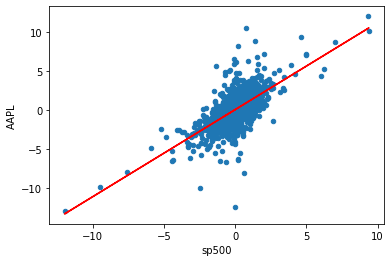

In [31]:
# Plot the scatter plot and the straight line on one plot
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

# Straight line equation with alpha and beta parameters 
# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')


In [32]:
# Calculate the average daily rate of return for S&P500
stocks_daily_return['sp500'].mean()


0.049316006600389206

In [33]:
# Calculate the annualized rate of return for S&P500 
# Note that out of 365 days/year, stock exchanges are closed for 104 days during weekend days (Saturday and Sunday) 
rm = stocks_daily_return['sp500'].mean() * 252
print(rm)

# Assume risk free rate is zero
# Also you can use the yield of a 10-years U.S. Government bond as a risk free rate
rf = 0 

# Calculate return for any stock (say APPL) using CAPM  
ER_AAPL = rf + ( beta * (rm-rf) ) 

ER_AAPL

12.42763366329808


13.830619238640283

#### Calculate Beta for all stocks 

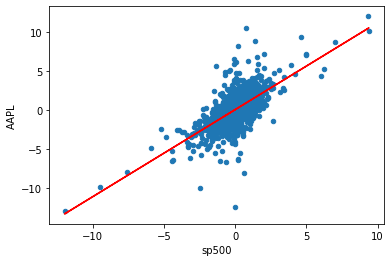

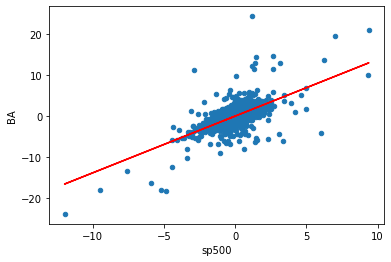

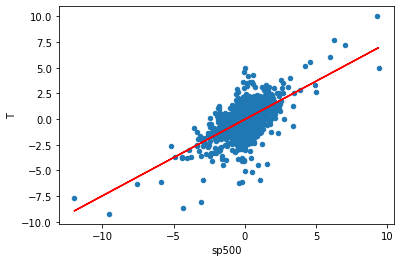

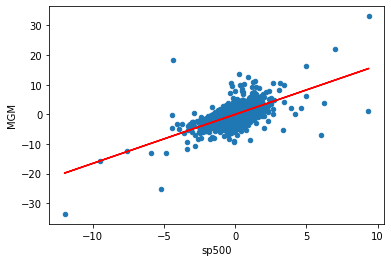

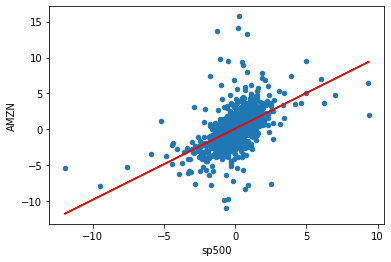

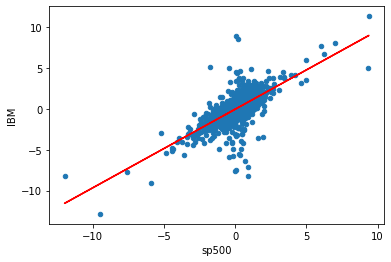

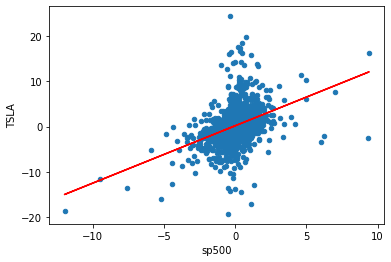

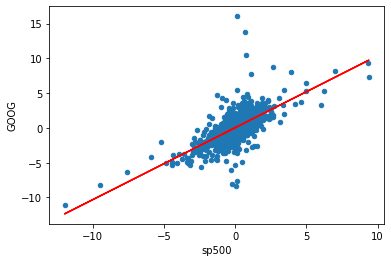

In [34]:
beta = {}
alpha = {}

# Loop on every stock daily return
for i in stocks_daily_return.columns:

    # Ignoring the date and S&P500 Columns 
    if i != 'Date' and i != 'sp500':
        # plot a scatter plot between each individual stock and the S&P500 (Market)
        stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = i)

        # Fit a polynomial between each stock and the S&P500 (Poly with order = 1 is a straight line)
        b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)

        plt.plot(stocks_daily_return['sp500'], b * stocks_daily_return['sp500'] + a, '-', color = 'r')

        beta[i] = b

        alpha[i] = a

        plt.show()

In [35]:
print("Beta: \n",beta,"\n \n","Alpha:\n", alpha)

Beta: 
 {'AAPL': 1.1128924148678097, 'BA': 1.3828672010892775, 'T': 0.7446293454747841, 'MGM': 1.653567706518011, 'AMZN': 0.9917345712576848, 'IBM': 0.9604149148095246, 'TSLA': 1.2686150101095908, 'GOOG': 1.0348817687428558} 
 
 Alpha:
 {'AAPL': 0.05281208469440272, 'BA': -0.002290698329753175, 'T': -0.028563430198461675, 'MGM': -0.016885305520478608, 'AMZN': 0.1022139641776523, 'IBM': -0.05345494150445109, 'TSLA': 0.1758349216516586, 'GOOG': 0.033355587214670135}


### APPLY CAPM FORMULA TO CALCULATE THE RETURN FOR THE PORTFOLIO


In [36]:
# Genrate list of all stock names
keys = list(beta.keys())
print(keys)

# Define the expected return dictionary
ER = {}

rf = 0 # assume risk free rate is zero in this case
rm = stocks_daily_return['sp500'].mean() * 252 # this is the expected return of the market 
rm

['AAPL', 'BA', 'T', 'MGM', 'AMZN', 'IBM', 'TSLA', 'GOOG']


12.42763366329808

In [37]:
for i in keys:
  # Calculate return for every security using CAPM  
  ER[i] = rf + ( beta[i] * (rm-rf) ) 

print('Expected Return Based on CAPM for')
for i in keys:
  print(' {} \t = \t {}%'.format(i, round(ER[i],3)))

Expected Return Based on CAPM for
 AAPL 	 = 	 13.831%
 BA 	 = 	 17.186%
 T 	 = 	 9.254%
 MGM 	 = 	 20.55%
 AMZN 	 = 	 12.325%
 IBM 	 = 	 11.936%
 TSLA 	 = 	 15.766%
 GOOG 	 = 	 12.861%


In [38]:
# Assume equal weights in the portfolio
portfolio_weights = 1/8 * np.ones(8) 
print("Weights:",portfolio_weights)

# Calculate the portfolio return 
ER_portfolio = sum(list(ER.values()) * portfolio_weights)
print("Portfolio return:",ER_portfolio)

print('Expected Return Based on CAPM for the portfolio is {}%\n'.format(ER_portfolio))

Weights: [0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
Portfolio return: 14.21348917679254
Expected Return Based on CAPM for the portfolio is 14.21348917679254%

